In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# !pip install folium

In [3]:
import folium


In [4]:
df = pd.read_csv('GCB2022v27_MtCO2_flat.csv')

df.head()

,Country,ISO 3166-1 alpha-3,Year,Total,Coal,Oil,Gas,Cement,Flaring,Other,Per Capita
0,Afghanistan,AFG,1750,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,1751,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,1752,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,AFG,1753,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,AFG,1754,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Tarea 2

* Buscar dataset con datos de los diferentes estados de México.

* En caso que sea necesario:

    * Quitar NaNs
    * Cambiar tipo de dato
    * Reestructurar
* Graficar con Seaborn (pairplot, violinplot, heatmap), utilizando en al menos una gráfica 'hue'.

* Hacer mapa coroplético.

### Buscamos el dataset e importamos

In [5]:
import pandas as pd
import numpy as np
import math
import random
import datetime
import time

import requests
import json

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colorbar

import folium
from folium import plugins

In [6]:
# ingest data
#Importamos el cvs del ejemplo del json. Por cualquier cosa
df_mx = pd.read_csv('1_min.csv')

# Leemos el Json
with open('municipality_geo-json_shapes.json') as f:
    geo_json_mx = json.load(f)

In [7]:
latCen_mx = +023.00
lonCen_mx = -100.00

indicaux = 'Percentage of Females of 15 to 29: 2015' # chose the indicator to plot

# define a map
map_mx = folium.Map(location=[latCen_mx, lonCen_mx], width=970, height=600, zoom_start=5, min_zoom=5, max_zo0m=10)

### Eliminamos Nan

In [8]:
df_mx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2436 entries, 0 to 2435
Data columns (total 66 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Code                                       2436 non-null   int64  
 1   Municipality                               2436 non-null   object 
 2   State Code                                 2436 non-null   int64  
 3   State                                      2436 non-null   object 
 4   Total Male Population: 2010                2436 non-null   int64  
 5   Total Female Population: 2010              2436 non-null   int64  
 6   Percentage of Males of 15 to 29: 2010      2436 non-null   float64
 7   Percentage of Males of 15 to 29: 2015      2436 non-null   float64
 8   Percentage of Females of 15 to 29: 2010    2436 non-null   float64
 9   Percentage of Females of 15 to 29: 2015    2436 non-null   float64
 10  Percentage of Males of 6

In [9]:
df_mx.dropna()

,Code,Municipality,State Code,State,Total Male Population: 2010,Total Female Population: 2010,Percentage of Males of 15 to 29: 2010,Percentage of Males of 15 to 29: 2015,Percentage of Females of 15 to 29: 2010,Percentage of Females of 15 to 29: 2015,...,Female Births: 2009,Female Births: 2010,Female Births: 2011,Female Births: 2012,Female Births: 2013,Female Births: 2014,Female Births: 2015,Female Births: 2016,Female Births: 2017,Female Births: 2018
0,9012,Tlalpan,9,Ciudad de México,312139,338428,26.9,11.716664,25.5,12.175235,...,5258,5275,5468,5286,5092,5243,4918,4480,4133,3932
1,9013,Xochimilco,9,Ciudad de México,205305,209702,27.9,12.364011,26.1,12.453208,...,3673,3779,3939,3865,3466,3712,3390,3314,2978,2828
2,9008,La Magdalena Contreras,9,Ciudad de México,114492,124594,26.1,11.946155,24.8,12.070394,...,2115,2147,2084,1966,2001,1944,1857,1715,1633,1547
3,9002,Azcapotzalco,9,Ciudad de México,196053,218658,25.5,10.831140,23.3,11.274462,...,3646,3693,3536,3572,3133,3246,2956,2790,2757,2426
4,9014,Benito Juárez,9,Ciudad de México,176410,209029,23.0,9.792389,20.9,10.331180,...,2394,2497,2443,2436,2378,2532,2402,2176,2079,1871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2431,23009,Tulum,23,Quintana Roo,14714,13549,32.4,16.500581,32.8,15.537690,...,335,380,383,361,368,359,448,449,402,478
2432,23002,Felipe Carrillo Puerto,23,Quintana Roo,37994,37032,28.0,13.099753,28.5,13.294267,...,1082,1049,964,847,760,1031,867,845,814,741
2433,23001,Cozumel,23,Quintana Roo,40357,39178,28.0,12.581149,28.0,13.219927,...,825,795,736,788,792,833,774,677,675,632
2434,23007,Lázaro Cárdenas,23,Quintana Roo,12972,12361,26.8,13.339206,28.2,13.731968,...,284,282,202,261,268,282,309,306,247,219


In [10]:
df_mx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2436 entries, 0 to 2435
Data columns (total 66 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Code                                       2436 non-null   int64  
 1   Municipality                               2436 non-null   object 
 2   State Code                                 2436 non-null   int64  
 3   State                                      2436 non-null   object 
 4   Total Male Population: 2010                2436 non-null   int64  
 5   Total Female Population: 2010              2436 non-null   int64  
 6   Percentage of Males of 15 to 29: 2010      2436 non-null   float64
 7   Percentage of Males of 15 to 29: 2015      2436 non-null   float64
 8   Percentage of Females of 15 to 29: 2010    2436 non-null   float64
 9   Percentage of Females of 15 to 29: 2015    2436 non-null   float64
 10  Percentage of Males of 6

### No Cambiamos el tipo de dato
Mantendremos los tipos de las columans, para trabajar. Dado que los números de nacimientos son enteros por naturaleza (No podemos tener medio nacimiento o fracción). Mientras que los porcentajes son flotantes.

In [11]:
#Nombres de columans
Names = list(df_mx.columns[4:])
Names

['Total Male Population: 2010',
 'Total Female Population: 2010',
 'Percentage of Males of 15 to 29: 2010',
 'Percentage of Males of 15 to 29: 2015',
 'Percentage of Females of 15 to 29: 2010',
 'Percentage of Females of 15 to 29: 2015',
 'Percentage of Males of 60 or more: 2010',
 'Percentage of Males of 60 or more: 2015',
 'Percentage of Females of 60 or more: 2010',
 'Percentage of Females of 60 or more: 2015',
 'Median Male Age: 2010',
 'Median Female Age: 2010',
 'Male Births: 1994',
 'Male Births: 1995',
 'Male Births: 1996',
 'Male Births: 1997',
 'Male Births: 1998',
 'Male Births: 1999',
 'Male Births: 2000',
 'Male Births: 2001',
 'Male Births: 2002',
 'Male Births: 2003',
 'Male Births: 2004',
 'Male Births: 2005',
 'Male Births: 2006',
 'Male Births: 2007',
 'Male Births: 2008',
 'Male Births: 2009',
 'Male Births: 2010',
 'Male Births: 2011',
 'Male Births: 2012',
 'Male Births: 2013',
 'Male Births: 2014',
 'Male Births: 2015',
 'Male Births: 2016',
 'Male Births: 2017',


In [12]:
import seaborn as sns

### Graficar con Seaborn (pairplot, violinplot, heatmap), utilizando en al menos una gráfica 'hue'.


#### Comenzamos con el Heatmap
De forma general

<Axes: >

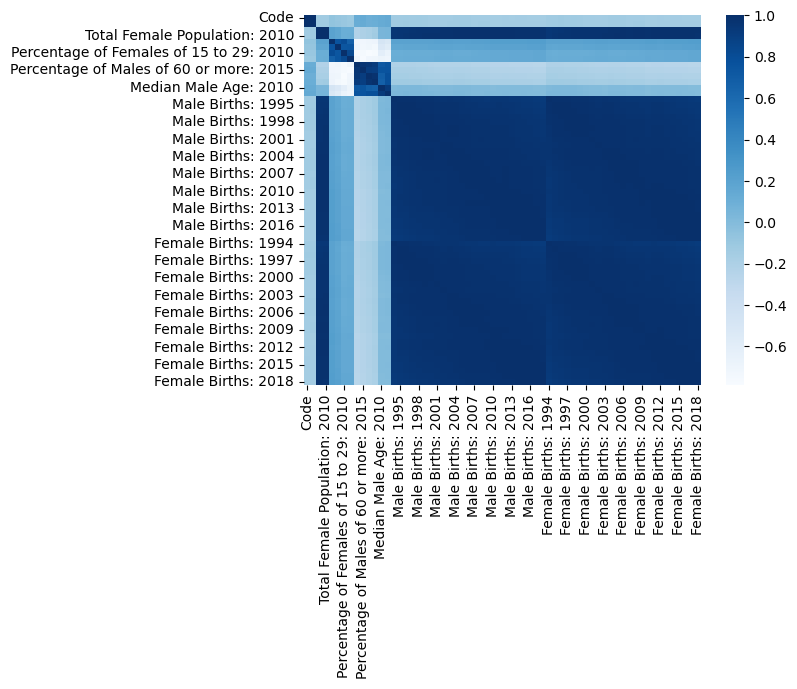

In [13]:
sns.heatmap(df_mx.corr(),cmap='Blues')

#### Ahora continuamos con las graficas de seaborn del tipo violinplot

Prueba del codigo de violinplot

<Axes: xlabel='State', ylabel='Male Births: 2017'>

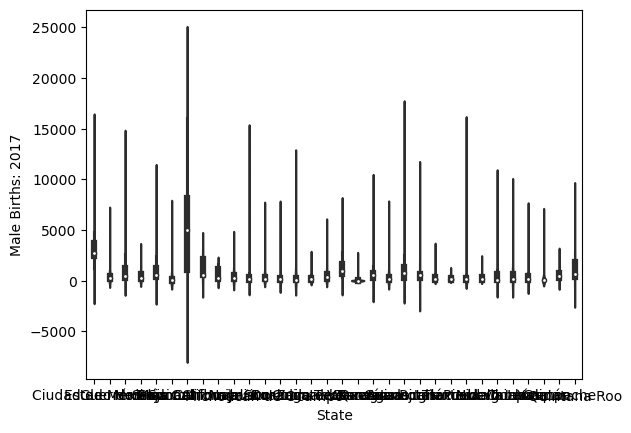

In [14]:
sns.violinplot(data=df_mx, x = 'State', y = 'Male Births: 2017', palette='plasma')

Ahora lo intentamos para todas las columnas de registros

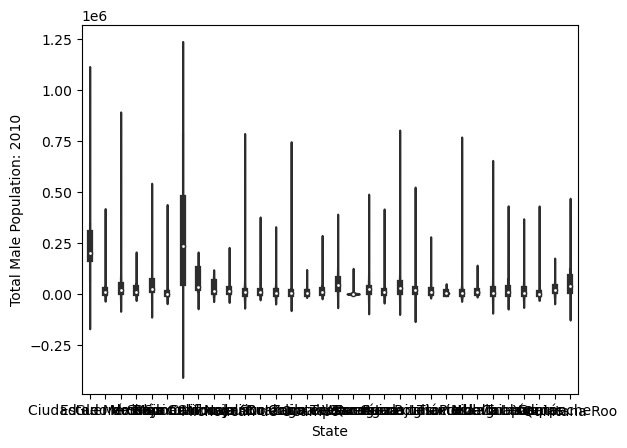

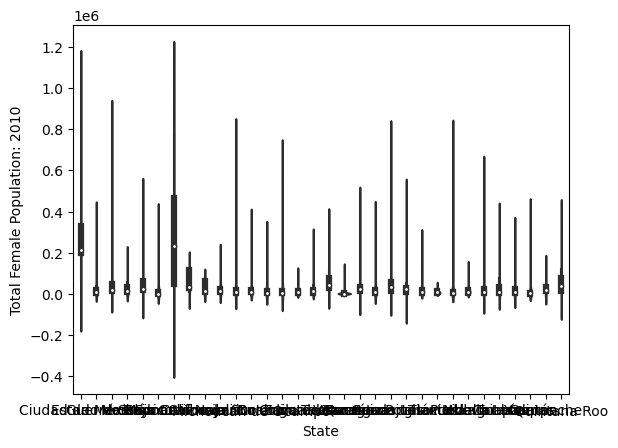

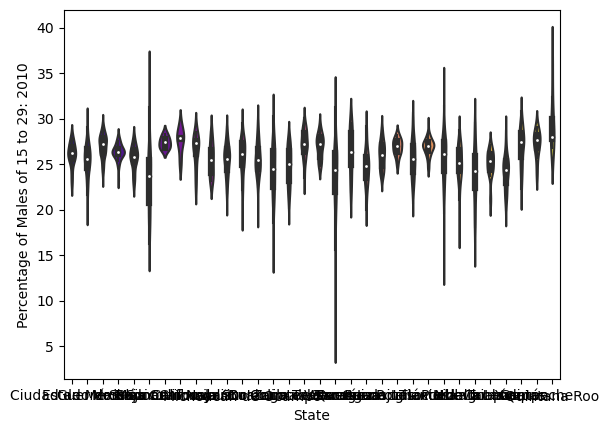

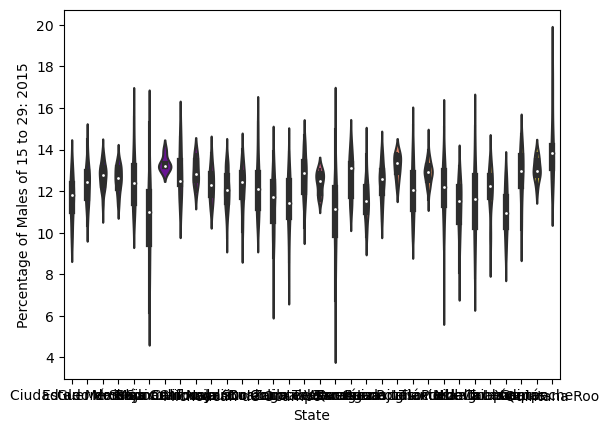

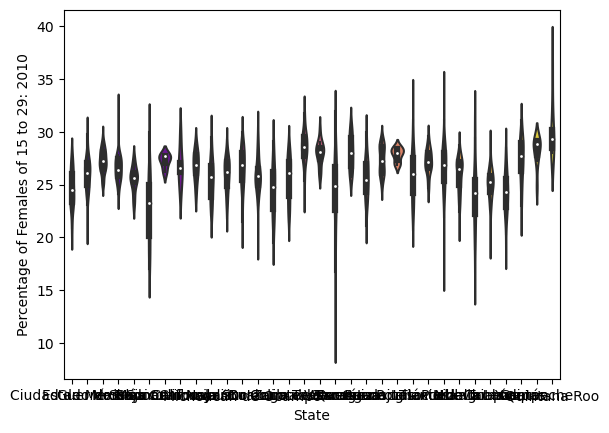

...

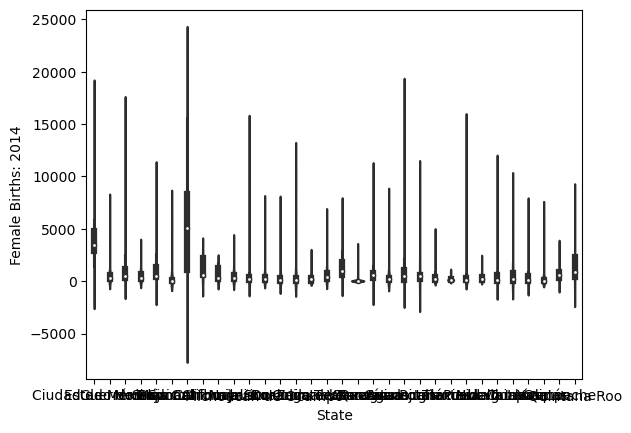

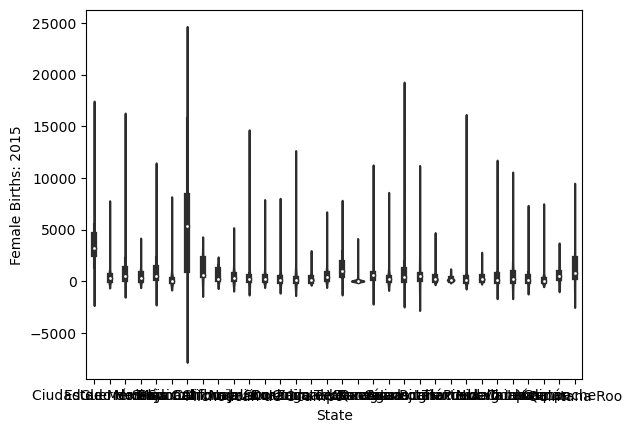

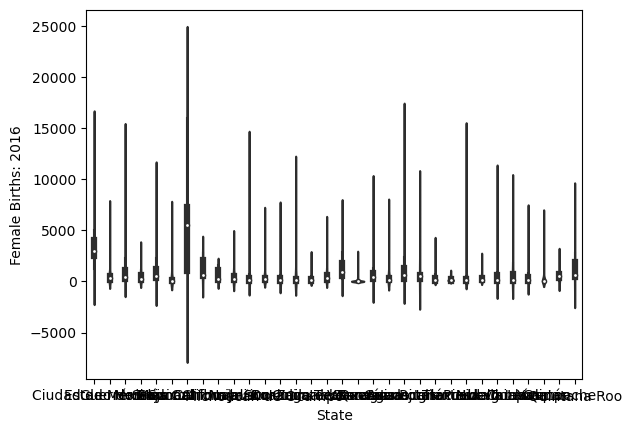

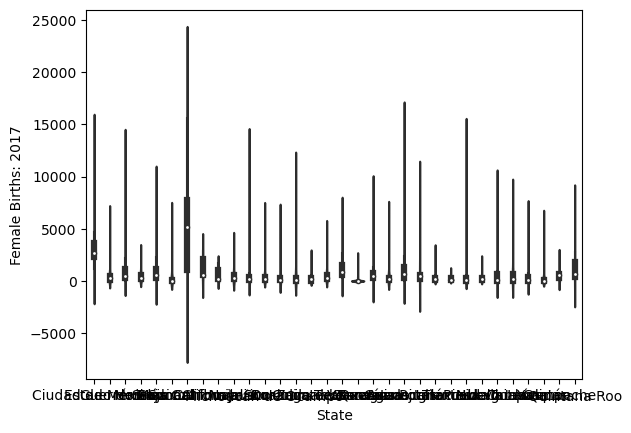

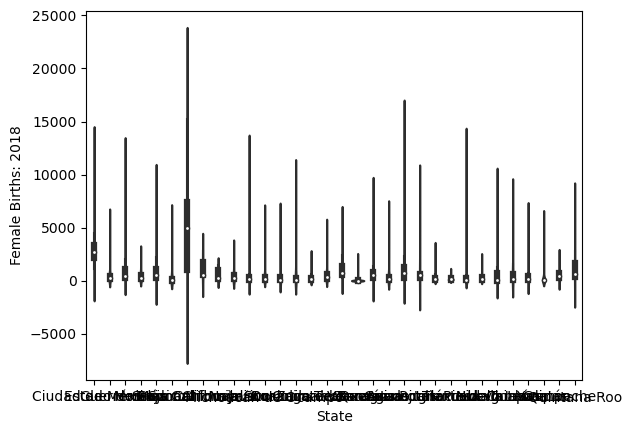

In [15]:
for i in range(len(Names)):
    sns.violinplot(data=df_mx, x = 'State', y = df_mx[Names[i]], palette='plasma')
    plt.show()

#### Repetimos el proceso para el boxplot

<Axes: xlabel='Male Births: 2017', ylabel='State'>

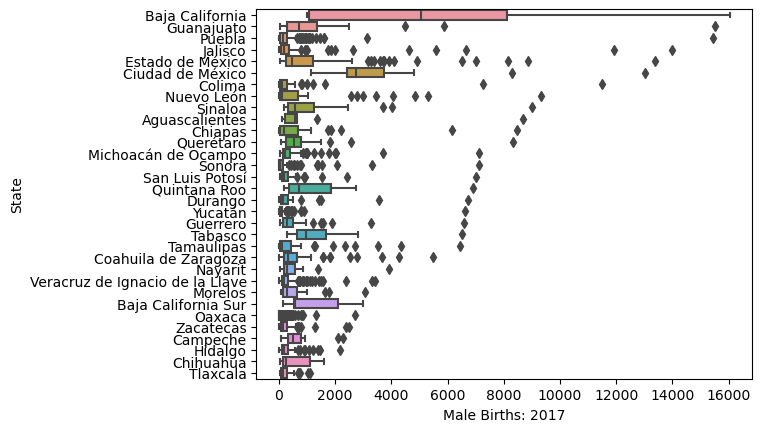

In [16]:
sns.boxplot(data = df_mx.sort_values(by=['Male Births: 2017'], ascending = False), x = 'Male Births: 2017', y = 'State')

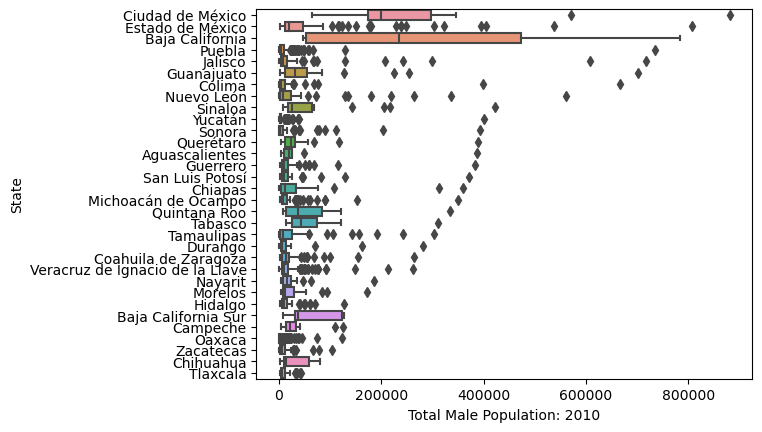

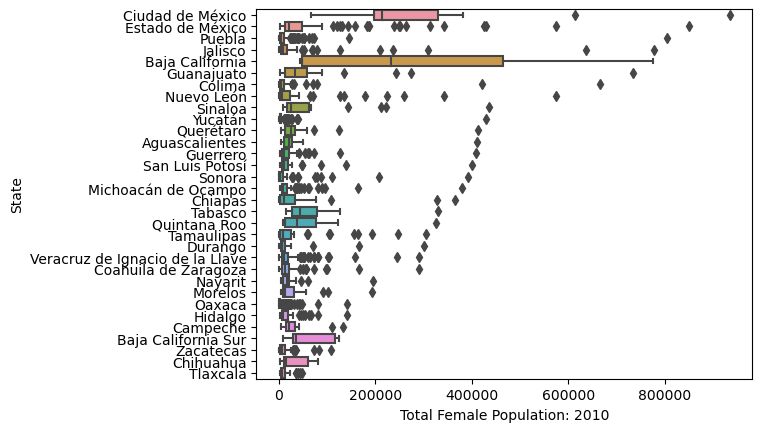

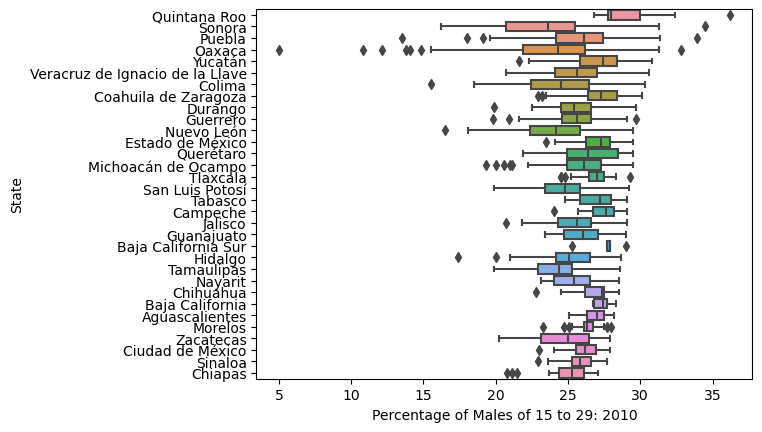

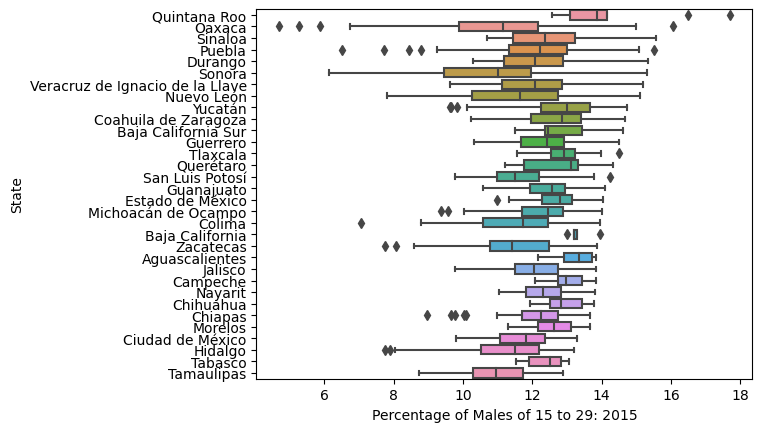

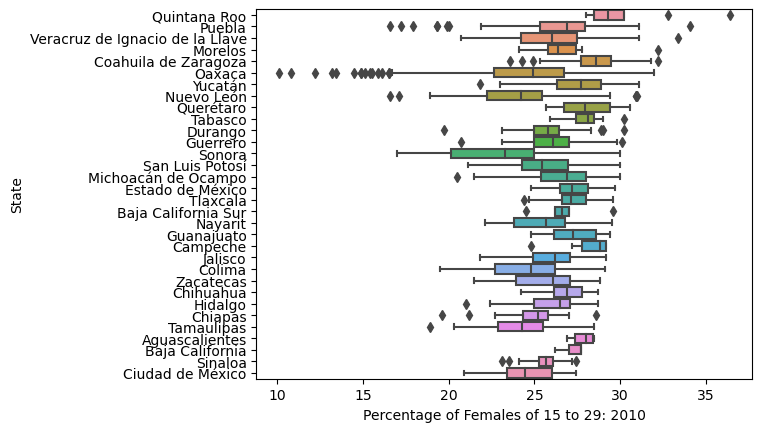

...

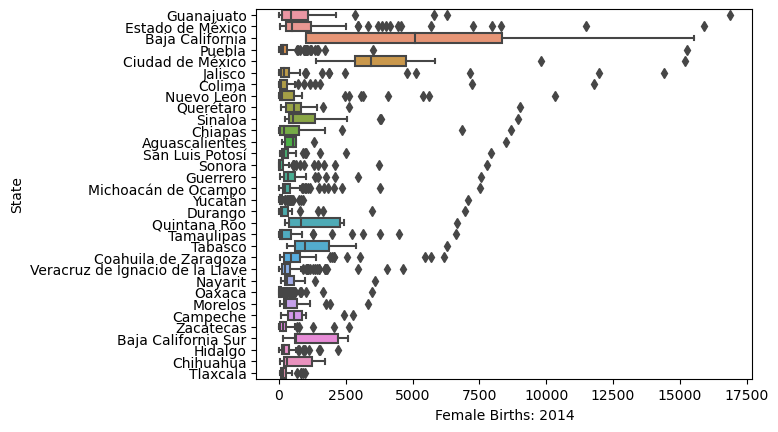

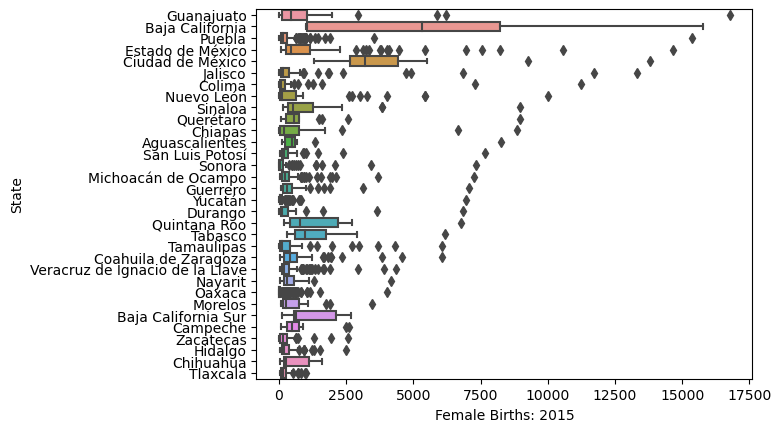

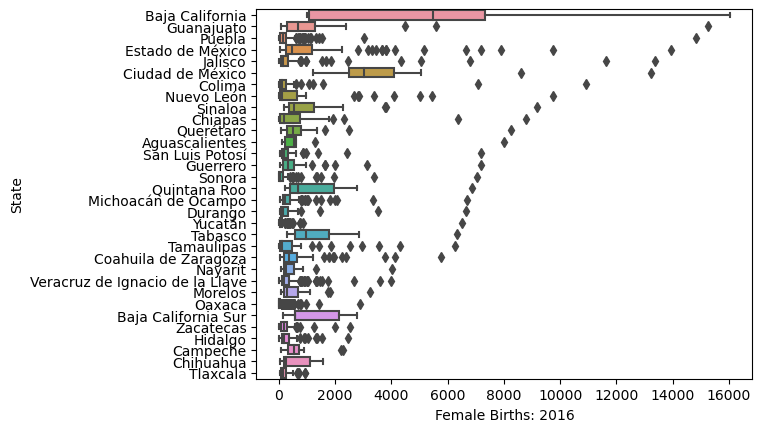

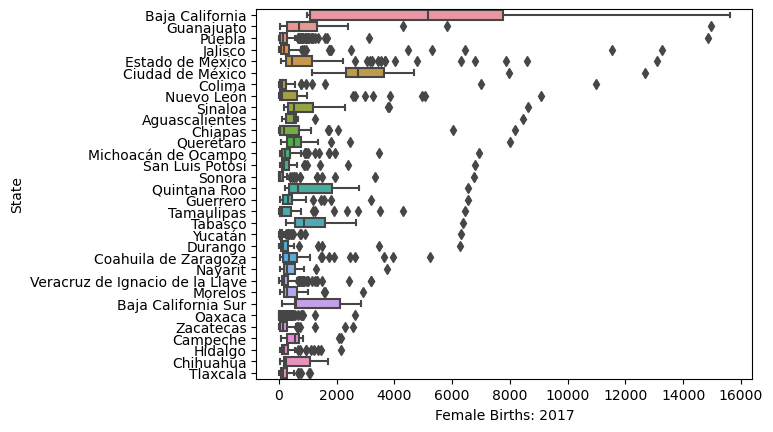

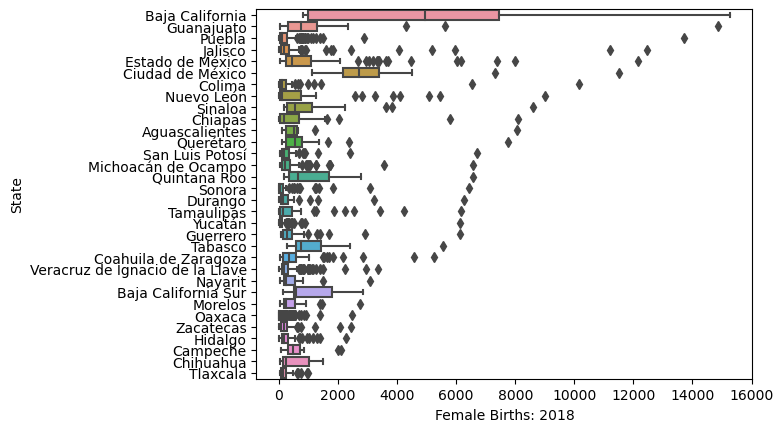

In [17]:
for i in range(len(Names)):
    sns.boxplot(data = df_mx.sort_values(by=[Names[i]], ascending = False), x = Names[i], y = 'State')
    plt.show()

#### Finalizamos con el grafico de tipo pairplot hue

In [18]:
#sns.pairplot(df_mx, hue="Genre", height=1.5, palette='plasma');

In [19]:
Names

['Total Male Population: 2010',
 'Total Female Population: 2010',
 'Percentage of Males of 15 to 29: 2010',
 'Percentage of Males of 15 to 29: 2015',
 'Percentage of Females of 15 to 29: 2010',
 'Percentage of Females of 15 to 29: 2015',
 'Percentage of Males of 60 or more: 2010',
 'Percentage of Males of 60 or more: 2015',
 'Percentage of Females of 60 or more: 2010',
 'Percentage of Females of 60 or more: 2015',
 'Median Male Age: 2010',
 'Median Female Age: 2010',
 'Male Births: 1994',
 'Male Births: 1995',
 'Male Births: 1996',
 'Male Births: 1997',
 'Male Births: 1998',
 'Male Births: 1999',
 'Male Births: 2000',
 'Male Births: 2001',
 'Male Births: 2002',
 'Male Births: 2003',
 'Male Births: 2004',
 'Male Births: 2005',
 'Male Births: 2006',
 'Male Births: 2007',
 'Male Births: 2008',
 'Male Births: 2009',
 'Male Births: 2010',
 'Male Births: 2011',
 'Male Births: 2012',
 'Male Births: 2013',
 'Male Births: 2014',
 'Male Births: 2015',
 'Male Births: 2016',
 'Male Births: 2017',


In [20]:
alpha = 2018-1994+1
for i in range(alpha):
    print(1994+i)

1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018


In [21]:
a =  ['Female Births: 1994',
 'Female Births: 1995',
 'Female Births: 1996',
 'Female Births: 1997',
 'Female Births: 1998',
 'Female Births: 1999',
 'Female Births: 2000',
 'Female Births: 2001',
 'Female Births: 2002',
 'Female Births: 2003',
 'Female Births: 2004',
 'Female Births: 2005',
 'Female Births: 2006',
 'Female Births: 2007',
 'Female Births: 2008',
 'Female Births: 2009',
 'Female Births: 2010',
 'Female Births: 2011',
 'Female Births: 2012',
 'Female Births: 2013',
 'Female Births: 2014',
 'Female Births: 2015',
 'Female Births: 2016',
 'Female Births: 2017',
 'Female Births: 2018']
b = ['Male Births: 1994',
 'Male Births: 1995',
 'Male Births: 1996',
 'Male Births: 1997',
 'Male Births: 1998',
 'Male Births: 1999',
 'Male Births: 2000',
 'Male Births: 2001',
 'Male Births: 2002',
 'Male Births: 2003',
 'Male Births: 2004',
 'Male Births: 2005',
 'Male Births: 2006',
 'Male Births: 2007',
 'Male Births: 2008',
 'Male Births: 2009',
 'Male Births: 2010',
 'Male Births: 2011',
 'Male Births: 2012',
 'Male Births: 2013',
 'Male Births: 2014',
 'Male Births: 2015',
 'Male Births: 2016',
 'Male Births: 2017',
 'Male Births: 2018']

In [22]:
copy = df_mx.copy()

Male_df = copy[b]
Female_df = copy[a]


In [23]:
Male_D = {'Male Births: 1994':'Births: 1994' ,
 'Male Births: 1995': 'Births: 1995',
 'Male Births: 1996': 'Births: 1996',
 'Male Births: 1997':'Births: 1997',
 'Male Births: 1998': 'Births: 1998',
 'Male Births: 1999': 'Births: 1999',
 'Male Births: 2000': 'Births: 2000',
 'Male Births: 2001': 'Births: 2001',
 'Male Births: 2002': 'Births: 2002',
 'Male Births: 2003': 'Births: 2003',
 'Male Births: 2004': 'Births: 2004',
 'Male Births: 2005': 'Births: 2005',
 'Male Births: 2006': 'Births: 2006',
 'Male Births: 2007': 'Births: 2007',
 'Male Births: 2008': 'Births: 2008',
 'Male Births: 2009': 'Births: 2009',
 'Male Births: 2010': 'Births: 2010',
 'Male Births: 2011' : 'Births: 2011',
 'Male Births: 2012': 'Births: 2012',
 'Male Births: 2013': 'Births: 2013',
 'Male Births: 2014': 'Births: 2014',
 'Male Births: 2015': 'Births: 2015',
 'Male Births: 2016': 'Births: 2016',
 'Male Births: 2017': 'Births: 2017',
 'Male Births: 2018': 'Births: 2018'}
Female_D = {'Female Births: 1994':'Births: 1994' ,
 'Female Births: 1995': 'Births: 1995',
 'Female Births: 1996': 'Births: 1996',
 'Female Births: 1997':'Births: 1997',
 'Female Births: 1998': 'Births: 1998',
 'Female Births: 1999': 'Births: 1999',
 'Female Births: 2000': 'Births: 2000',
 'Female Births: 2001': 'Births: 2001',
 'Female Births: 2002': 'Births: 2002',
 'Female Births: 2003': 'Births: 2003',
 'Female Births: 2004': 'Births: 2004',
 'Female Births: 2005': 'Births: 2005',
 'Female Births: 2006': 'Births: 2006',
 'Female Births: 2007': 'Births: 2007',
 'Female Births: 2008': 'Births: 2008',
 'Female Births: 2009': 'Births: 2009',
 'Female Births: 2010': 'Births: 2010',
 'Female Births: 2011' : 'Births: 2011',
 'Female Births: 2012': 'Births: 2012',
 'Female Births: 2013': 'Births: 2013',
 'Female Births: 2014': 'Births: 2014',
 'Female Births: 2015': 'Births: 2015',
 'Female Births: 2016': 'Births: 2016',
 'Female Births: 2017': 'Births: 2017',
 'Female Births: 2018': 'Births: 2018'}

In [24]:
Male_df.rename(columns=Male_D,inplace = False)
Female_df.rename(columns=Female_D,inplace = False)


,Births: 1994,Births: 1995,Births: 1996,Births: 1997,Births: 1998,Births: 1999,Births: 2000,Births: 2001,Births: 2002,Births: 2003,...,Births: 2009,Births: 2010,Births: 2011,Births: 2012,Births: 2013,Births: 2014,Births: 2015,Births: 2016,Births: 2017,Births: 2018
0,5744,5369,5392,5246,5369,5351,5591,5254,5336,5078,...,5258,5275,5468,5286,5092,5243,4918,4480,4133,3932
1,3930,3733,3793,3848,3699,3774,3793,3778,3569,3728,...,3673,3779,3939,3865,3466,3712,3390,3314,2978,2828
2,2439,2269,2151,2491,2474,2504,2419,2429,2475,2226,...,2115,2147,2084,1966,2001,1944,1857,1715,1633,1547
3,6522,5699,5374,5365,5354,5052,5242,4742,4700,4280,...,3646,3693,3536,3572,3133,3246,2956,2790,2757,2426
4,4191,4082,3589,3498,3288,3028,2992,2790,2624,2718,...,2394,2497,2443,2436,2378,2532,2402,2176,2079,1871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2431,0,0,0,0,0,0,0,0,0,0,...,335,380,383,361,368,359,448,449,402,478
2432,821,867,1023,867,935,1035,1026,733,1350,920,...,1082,1049,964,847,760,1031,867,845,814,741
2433,637,680,675,744,736,760,844,886,848,787,...,825,795,736,788,792,833,774,677,675,632
2434,285,309,277,287,320,353,358,279,341,329,...,284,282,202,261,268,282,309,306,247,219


In [25]:
Male_df['Genre'] = 'Male'
Female_df['Genre'] = 'Female'
Female_df

C:\Users\SAMMH\AppData\Local\Temp\ipykernel_14624\863380059.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Male_df['Genre'] = 'Male'
C:\Users\SAMMH\AppData\Local\Temp\ipykernel_14624\863380059.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Female_df['Genre'] = 'Female'


,Female Births: 1994,Female Births: 1995,Female Births: 1996,Female Births: 1997,Female Births: 1998,Female Births: 1999,Female Births: 2000,Female Births: 2001,Female Births: 2002,Female Births: 2003,...,Female Births: 2010,Female Births: 2011,Female Births: 2012,Female Births: 2013,Female Births: 2014,Female Births: 2015,Female Births: 2016,Female Births: 2017,Female Births: 2018,Genre
0,5744,5369,5392,5246,5369,5351,5591,5254,5336,5078,...,5275,5468,5286,5092,5243,4918,4480,4133,3932,Female
1,3930,3733,3793,3848,3699,3774,3793,3778,3569,3728,...,3779,3939,3865,3466,3712,3390,3314,2978,2828,Female
2,2439,2269,2151,2491,2474,2504,2419,2429,2475,2226,...,2147,2084,1966,2001,1944,1857,1715,1633,1547,Female
3,6522,5699,5374,5365,5354,5052,5242,4742,4700,4280,...,3693,3536,3572,3133,3246,2956,2790,2757,2426,Female
4,4191,4082,3589,3498,3288,3028,2992,2790,2624,2718,...,2497,2443,2436,2378,2532,2402,2176,2079,1871,Female
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2431,0,0,0,0,0,0,0,0,0,0,...,380,383,361,368,359,448,449,402,478,Female
2432,821,867,1023,867,935,1035,1026,733,1350,920,...,1049,964,847,760,1031,867,845,814,741,Female
2433,637,680,675,744,736,760,844,886,848,787,...,795,736,788,792,833,774,677,675,632,Female
2434,285,309,277,287,320,353,358,279,341,329,...,282,202,261,268,282,309,306,247,219,Female


In [26]:
df_2 = pd.concat([Male_df, Female_df],  ignore_index = True)

In [27]:
#sns.pairplot(df_2, hue = 'Genre')

In [38]:
a = ['State', 'Female Births: 1994']
b = ['State', 'Male Births: 1994']
Male_D = {'Male Births: 1994':'Births: 1994' }
Female_D = {'Female Births: 1994':'Births: 1994' }

Male_df = copy[b]
Female_df = copy[a]
Male_df['Genre'] = 'Male'
Female_df['Genre'] = 'Female'

Female_df
df_3 = pd.concat([Male_df, Female_df],  ignore_index = True)

C:\Users\SAMMH\AppData\Local\Temp\ipykernel_14624\1613616077.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Male_df['Genre'] = 'Male'
C:\Users\SAMMH\AppData\Local\Temp\ipykernel_14624\1613616077.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Female_df['Genre'] = 'Female'


In [44]:
Female_df

,State,Female Births: 1994,Genre
0,Ciudad de México,5744,Female
1,Ciudad de México,3930,Female
2,Ciudad de México,2439,Female
3,Ciudad de México,6522,Female
4,Ciudad de México,4191,Female
...,...,...,...
2431,Quintana Roo,0,Female
2432,Quintana Roo,821,Female
2433,Quintana Roo,637,Female
2434,Quintana Roo,285,Female


In [45]:
Male_df.rename(columns=Male_D,inplace = False)
Female_df.rename(columns=Female_D,inplace = False)

,State,Births: 1994,Genre
0,Ciudad de México,5744,Female
1,Ciudad de México,3930,Female
2,Ciudad de México,2439,Female
3,Ciudad de México,6522,Female
4,Ciudad de México,4191,Female
...,...,...,...
2431,Quintana Roo,0,Female
2432,Quintana Roo,821,Female
2433,Quintana Roo,637,Female
2434,Quintana Roo,285,Female


In [48]:
df_4 = pd.concat([Male_df, Female_df],  ignore_index = True)

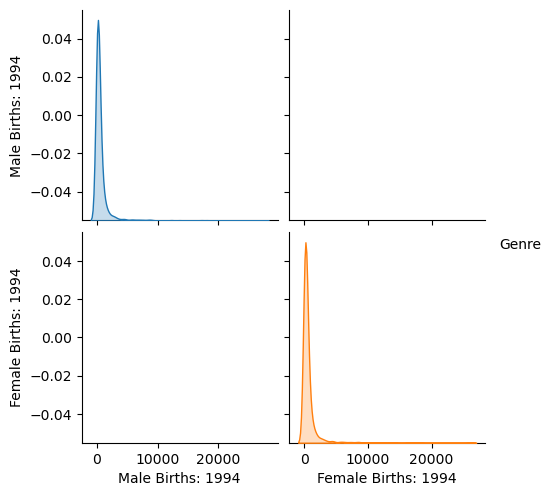

In [49]:
sns.pairplot(df_4, hue = 'Genre')

## Mapa

In [30]:
latCen_mx = +023.00
lonCen_mx = -100.00

indicaux = 'Male Births: 2017' # chose the indicator to plot

# define a map
map_mx = folium.Map(location=[latCen_mx, lonCen_mx], width=970, height=600, zoom_start=5, min_zoom=5, max_zoom=10)

map_mx.choropleth(geo_data=geo_json_mx, data=df_mx,
    columns=['Code', indicaux],
    key_on='feature.properties.mun_code',
    fill_color='YlGnBu', fill_opacity=0.9, 
    line_opacity=0.2
)

map_mx

C:\Users\SAMMH\anaconda3\lib\site-packages\folium\folium.py:465: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


#### Ahora lo generalizamos:


In [31]:
for i in range(len(Names)):
    latCen_mx = +023.00
    lonCen_mx = -100.00

    indicaux = Names[i]

    # define a map
    map_mx = folium.Map(location=[latCen_mx, lonCen_mx], width=970, height=600, zoom_start=5, min_zoom=5, max_zoom=10)

    map_mx.choropleth(geo_data=geo_json_mx, data=df_mx,
        columns=['Code', indicaux],
        key_on='feature.properties.mun_code',
        fill_color='YlGnBu', fill_opacity=0.9, 
        line_opacity=0.2
    )

    map_mx